In [1]:
import os

os.environ["CUDA_VISIBLE_DEVICES"]="3"

In [3]:
import lpips
loss_fn_alex = lpips.LPIPS(net='alex') # best forward scores
loss_fn_vgg = lpips.LPIPS(net='vgg') # closer to "traditional" perceptual loss, when used for optimization

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth


In [ ]:


d = loss_fn_alex(img0, img1)

In [4]:
#!pip install imageio
# !pip install -U matplotlib
#

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.9/101.9 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 75.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.0/325.0 kB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 127.8 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 105.5 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [6]:
# Download the model
import argparse
import numpy as np
import PIL.Image
import dnnlib
import re
import sys
from io import BytesIO
import IPython.display
import numpy as np
from math import ceil
from PIL import Image, ImageDraw
import imageio
import matplotlib.pyplot as plt
import legacy
import cv2
import torch
from tqdm.autonotebook import tqdm

device = torch.device('cuda')

# Choose between these pretrained models
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqcat.pkl
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqdog.pkl
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqwild.pkl
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/brecahad.pkl
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/cifar10.pkl
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
# https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl

network_pkl = "./results/00022-stylegan3-t-nih_chexpert-gpus4-batch16-gamma1/network-snapshot-004000.pkl"
# If downloads fails, you can try downloading manually and uploading to the session directly 
# network_pkl = "/content/ffhq.pkl"

print('Loading networks from "%s"...' % network_pkl)
with dnnlib.util.open_url(network_pkl) as f:
  G = legacy.load_network_pkl(f)['G_ema'].to(device) # type: ignore

ModuleNotFoundError: No module named 'torch'

In [6]:
arr = [0, 1, 2, 3, 4]
print(arr[:4])
print(arr[:3])
print(arr[:2])

[0, 1, 2, 3]
[0, 1, 2]
[0, 1]


In [4]:
n_samples = 5e5
def get_mean_latent():
  z = torch.randn((int(n_samples), 512), device=device)
  batch_size = int(1e5)

  w_mean = torch.zeros((1,16,512),requires_grad=True,device=device)
  for i in range(int(n_samples/batch_size)):
    w = G.mapping(z[i*batch_size:(i+1)*batch_size,:], None)
    w = torch.sum(w, dim = 0).unsqueeze(0)
    w_mean = w_mean + w

  w_mean = w_mean / n_samples

  return w_mean.clone().detach().requires_grad_(True)

In [3]:
# # Convert .pkl to .pth or .pt
# with dnnlib.util.open_url(network_pkl) as f:
#     G_nvidia = legacy.load_network_pkl(f)["G_ema"]

# state_nv = G_nvidia.state_dict()
# torch.save(G_nvidia.state_dict(), "g_ema.pth")

In [3]:
# Useful utility functions...

# Generates an image from a style vector.
def generate_image_from_style(dlatent, noise_mode='none'):
    if len(dlatent.shape) == 1: 
        dlatent = dlatent.unsqueeze(0)

    row_images = G.synthesis(dlatent, noise_mode=noise_mode)
    row_images = (row_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return row_images[0].cpu().numpy()    

# Converts a noise vector z to a style vector w.
def convert_z_to_w(latent, truncation_psi=0.7, truncation_cutoff=9, class_idx=None):
    label = torch.zeros([1, G.c_dim], device=device)   
    if G.c_dim != 0:
        if class_idx is None:
            RuntimeError('Must specify class label with class_idx when using a conditional network')
        label[:, class_idx] = 1
    else:
        if class_idx is not None:
            print(f'warning: class_idx={class_idx} ignored when running on an unconditional network')
    return G.mapping(latent, label, truncation_psi=truncation_psi, truncation_cutoff=truncation_cutoff)

In [5]:
# # Set device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Set hyperparameters
# num_epochs = 10
# batch_size = 64
# learning_rate = 0.001

# # Initialize transformations for data augmentation
# transform = transforms.Compose([
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomVerticalFlip(),
#     transforms.RandomRotation(degrees=45),
#     transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
#     transforms.CenterCrop(224),
#     transforms.ToTensor(),
# #     transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
# ])

# # Load the ImageNet Object Localization Challenge dataset
# train_dataset = torchvision.datasets.ImageFolder(
#     root='../chexpert/versions/1', 
#     transform=transform
# )

In [6]:
# # Update csv files
# import pandas as pd
# import os

# # Define paths to CSV files
# train_csv = "../chexpert/versions/1/train.csv"
# test_csv = "../chexpert/versions/1/valid.csv"

# # Function to update paths in the CSV
# def update_paths(csv_file, current_prefix, new_prefix):
#     """
#     Updates file paths in the CSV file.
    
#     Args:
#         csv_file (str): Path to the CSV file.
#         current_prefix (str): Current incorrect prefix in file paths.
#         new_prefix (str): New correct prefix for file paths.
#     """
#     # Load CSV
#     df = pd.read_csv(csv_file)
 
#     # Assuming the first column contains the file paths
#     df.iloc[:, 0] = df.iloc[:, 0].str.replace(current_prefix, new_prefix)
    
#     # Assuming the first column contains the file paths
#     df.iloc[:, 0] = df.iloc[:, 0]
#     print(df.iloc[:, 0])
    
#     # Save the updated CSV back to disk
#     df.to_csv(csv_file, index=False)

# # Specify the incorrect and correct prefixes
# current_prefix = "CheXpert-v1.0-small/train/"
# new_prefix = "../chexpert/versions/1/train/"

# # Update train and test CSV files
# update_paths(train_csv, current_prefix, new_prefix)
# # update_paths(test_csv, current_prefix, new_prefix)

# print("Paths updated successfully in train.csv and test.csv!")


In [4]:
import os
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torch
from PIL import Image
from tqdm import tqdm

# Custom Dataset for CheXpert
class CheXpertDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.labels_df = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.labels_df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.labels_df.iloc[idx, 0] # First column contains image paths
        image = Image.open(img_name).convert("RGB")  # Convert to RGB if grayscale
        label = 0 if self.labels_df.iloc[idx, 1] == "Female" else 1  # "sex" is the second column

        if self.transform:
            image = self.transform(image)

        return image, label

# Define paths
train_csv = "../chexpert/versions/1/train.csv"
train_dir = "../chexpert/versions/1/train/"
test_csv = "../chexpert/versions/1/valid.csv"
test_dir = "../chexpert/versions/1/valid/"

# Image transformations (augmentation and normalization)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet50 expects 224x224 images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Pretrained ResNet normalization
])

# Create datasets
train_dataset = CheXpertDataset(csv_file=train_csv, root_dir=train_dir, transform=transform)
test_dataset = CheXpertDataset(csv_file=test_csv, root_dir=test_dir, transform=transform)
print("Chexpert Dataset Loaded...")
train_dataset

Chexpert Dataset Loaded...


In [ ]:
import torchvision

batch_size = 16
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

# Load the ResNet50 model
model = torchvision.models.resnet50(pretrained=True)

# Parallelize training across multiple GPUs
model = torch.nn.DataParallel(model)

# Set the model to run on the device
model = model.to(device)

# Define the loss function and optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Train the model
for epoch in tqdm(range(num_epochs)):
    model.train()  # Set the model to training mode
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    for inputs, labels in train_loader:
        # Move input and label tensors to the device
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Zero out the optimizer
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Accumulate loss
        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs, 1)  # Get predictions
        correct_predictions += (predicted == labels).sum().item()  # Compare predictions to labels
        total_samples += labels.size(0)
        
    # Calculate average loss and accuracy for the epoch
    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = correct_predictions / total_samples

    # Print loss and accuracy for the epoch
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')

print('Finished Training!')


In [ ]:
# Save the model weights
save_path = "chexpert_resnet50_age_classifier.pth"
torch.save(model.state_dict(), save_path)
print(f"Model weights saved to {save_path}")

## Load Gender & Pneumonia Classifiers

In [4]:
from torchvision import models as tv
import torch
import torchvision
from torchvision import models, transforms

gender_classifier_path, pneumonia_classifier_path = '../resnet50_gender_classifier.pth', '../resnet50_pneumonia_classifier.pth'

# Reload the model structure  # Set pretrained=False since we are loading custom weights
gender_cnn, pneumonia_cnn = torchvision.models.resnet50(pretrained=False), torchvision.models.resnet50(pretrained=False) 
gender_cnn, pneumonia_cnn = torch.nn.DataParallel(gender_cnn), torch.nn.DataParallel(pneumonia_cnn)

# Load the saved weights
gender_cnn.load_state_dict(torch.load(gender_classifier_path)); pneumonia_cnn.load_state_dict(torch.load(pneumonia_classifier_path))

# Move the model to the appropriate device
gender_cnn, pneumonia_cnn = gender_cnn.to(device), pneumonia_cnn.to(device)
gender_cnn.eval(); pneumonia_cnn.eval()  # Set the model to evaluation mode
print("Model weights loaded successfully!")

/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Model weights loaded successfully!


## Performance evaluation

In [5]:
# Image transformations (augmentation and normalization)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet50 expects 224x224 images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Pretrained ResNet normalization
])

# positive case = array(true)
def xray_has_pneumonia(img):
    im = Image.fromarray(img)
    im = transform(im)
#     im = Image.fromarray(im).convert("RGB") # if greyscale
    logits = pneumonia_cnn(im[None,:,:,:])[0,0]
    return (logits < 0.5).detach().cpu().numpy()

# if true than model predicts male else female
def xray_is_male(img):
    im = Image.fromarray(img)
    im = transform(im)
#     im = Image.fromarray(im).convert("RGB") # if greyscale
    logits = gender_cnn(im[None,:,:,:])[0,0]
    return (logits < 0.5).detach().cpu().numpy()

In [9]:
# from tqdm import tqdm
# import numpy as np
# """
# :- Sample 1000 random z vectors
# :- Then convert them to style vectors w
# :- Get their corresponding perceived genders
# """
# styles, genders, pneumonia, images = [],[],[],[]
# for idx in tqdm(range(0,1000)):
#     z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device) # get random z vector
#     w = convert_z_to_w(z, truncation_psi=0.7, truncation_cutoff=9) # convert to style vector
#     img = generate_image_from_style(w) # generate image from w
#     gen, pneu = xray_is_male(img), xray_has_pneumonia(img)   # classify image with cnn classifier
#     # save data
#     styles.append(w.cpu().detach().numpy()); images.append(img)
#     genders.append(gen); pneumonia.append(pneu) # save predictions

## Generate random style vectors

In [7]:
def save_data(data, idx):
    df, images = pd.DataFrame(data)df[['style', 'gender', 'pneumonia']], data['image']
    for subject in range(len(df)):
        savepath="synth_"+str(subject).zfill(5)
        images, metadata

SyntaxError: invalid syntax (2479186716.py, line 2)

In [69]:
def add_pneumonia(data={}, n_patients=300):
    # Generate n pneumonia patients
    styles, gender, pneumonia, images = [],[],[],[]
    n_pneumonia = 0
    count = 1
    while(n_pneumonia < n_patients):
        z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device) # get random z vector
        w = convert_z_to_w(z, truncation_psi=0.7, truncation_cutoff=9) # convert to style vector
        img = generate_image_from_style(w) # generate image from w
        gen, pneu = xray_is_male(img), xray_has_pneumonia(img)
        if pneu:
            styles.append(w.cpu().detach().numpy()); images.append(img)
            gender.append('male') if gen else gender.append('female')
            pneumonia.append(1); n_pneumonia+=1
        sys.stdout.write(f"\r# of pneumonia patients: {n_pneumonia}; n_completed = {count}")
        sys.stdout.flush()
        count += 1
    if(len(data) > 0):
        data['style'].extend(styles); data['gender'].extend(gender); data['pneumonia'].extend(pneumonia)
        data['image'].extend(images)
    else:
        data['style'], data['gender'], data['pneumonia'], data['image'] = styles, gender, pneumonia, images
    return data

In [106]:
def create_pneumonia_dataset(n_patients=1000):
    # Generate 1000 male and female images
    styles, gender, pneumonia, images = [],[],[],[]
    n_negative, n_positive = 0,0
    while((nofind < n_patients) or (pneu < n_patients)):
        z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device) # get random z vector
        w = convert_z_to_w(z, truncation_psi=0.7, truncation_cutoff=9) # convert to style vector
        img = generate_image_from_style(w) # generate image from w
        gen, pneu = xray_is_male(img), xray_has_pneumonia(img)
        if pneu and n_positive < n_patients:
            styles.append(w.cpu().detach().numpy()); gender.append('male'); images.append(img)
            pneumonia.append(1)
            pneu+=1
        elif n_negative < n_patients:
            styles.append(w.cpu().detach().numpy()); gender.append('female'); images.append(img)
            pneumonia.append(0) 
            female+=1
        sys.stdout.write(f"\r# males: {male}, # females: {female}")
        sys.stdout.flush()
        
    # initialize synthetic dataset
    data = {"style": styles,
            "gender": gender,
            "pneumonia": pneumonia,
            "image": images}
    print("\n",len(data['style']), len(data['gender']), len(data['pneumonia']), len(data['image']))
    data = add_pneumonia(data)
    print("\n",len(data['style']), len(data['gender']), len(data['pneumonia']), len(data['image']))
    # Create DataFrame
    return pd.DataFrame(data)

n_iterations = .25 * len(rsna_df)
data = add_pneumonia(n_patients = )

# of pneumonia patients: 0; n_completed = 660

KeyboardInterrupt: 

In [71]:
import pandas as pd

def create_synthetic_dataset(n_patients=500):
    # Generate 1000 male and female images
    styles, gender, pneumonia, images = [],[],[],[]
    male, female = 0,0
    while((male < n_patients) or (female < n_patients)):
        z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device) # get random z vector
        w = convert_z_to_w(z, truncation_psi=0.7, truncation_cutoff=9) # convert to style vector
        img = generate_image_from_style(w) # generate image from w
        gen, pneu = xray_is_male(img), xray_has_pneumonia(img)
        if xray_is_male(img) and male < n_patients:
            styles.append(w.cpu().detach().numpy()); gender.append('male'); images.append(img)
            pneumonia.append(1) if pneu else pneumonia.append(0)
            male+=1
        elif female < n_patients:
            styles.append(w.cpu().detach().numpy()); gender.append('female'); images.append(img)
            pneumonia.append(1) if pneu else pneumonia.append(0)
            female+=1
        sys.stdout.write(f"\r# males: {male}, # females: {female}")
        sys.stdout.flush()
        
    # initialize synthetic dataset
    data = {"style": styles,
            "gender": gender,
            "pneumonia": pneumonia,
            "image": images}
    print("\n",len(data['style']), len(data['gender']), len(data['pneumonia']), len(data['image']))
    # Create DataFrame
    return pd.DataFrame(data)

In [72]:
df = create_synthetic_dataset()

# males: 500, # females: 500
 1000 1000 1000 1000


In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# load RSNA csv
rsna_df = pd.read_csv('../datasets/rsna_patients.csv')
rsna_df = rsna_df.drop_duplicates(subset='Image Index', keep="last") # Clean the data
len(rsna_df)

30000

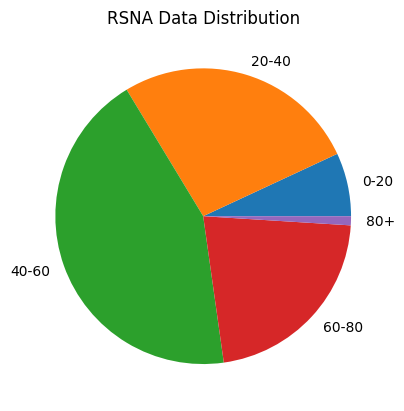

In [2]:
classes = [2149, 8008, 13118, 6454, 271]
percentages = [round(classes[0]/sum(classes), 2), round(classes[1]/sum(classes), 2),
               round(classes[2]/sum(classes), 2), round(classes[3]/sum(classes), 2),
               round(classes[4]/sum(classes), 2)]
labels = ['0-20', '20-40', '40-60', '60-80', '80+']

# Create pie chart
plt.pie(percentages, labels=labels)

# Add title
plt.title('RSNA Data Distribution')

# Show the plot
plt.show()

In [3]:
"""
Class Labels:

0: 0-20
1: 20-40
2: 40-60
3: 60-80
4: 80+
"""

def load_data(df):
    y_column = 'Patient Age'
    tmp = df.copy()
    for idx in range(len(tmp)):
        if tmp.iloc[idx][y_column] > 0 and tmp.iloc[idx][y_column] <= 20:
            tmp.at[idx, y_column] = 0
        elif tmp.iloc[idx][y_column] > 20 and tmp.iloc[idx][y_column] <= 40:
            tmp.at[idx, y_column] = 1
        elif tmp.iloc[idx][y_column] >= 40 and tmp.iloc[idx][y_column] <= 60:
            tmp.at[idx, y_column] = 2
        elif tmp.iloc[idx][y_column] >= 60 and tmp.iloc[idx][y_column] <= 80:
            tmp.at[idx, y_column] = 3
        elif tmp.iloc[idx][y_column] > 80:
            tmp.at[idx, y_column] = 4
    classes =  tmp[y_column].unique()
    print(f'classes: {classes}, n_classes: {len(classes)}')

    return tmp

df = load_data(rsna_df)
class0 = df[df["Patient Age"] == 0]
class1 = df[df["Patient Age"] == 1]
class2 = df[df["Patient Age"] == 2]
class3 = df[df["Patient Age"] == 3]
class4 = df[df["Patient Age"] == 4]

classes: [4 3 2 1 0], n_classes: 5


In [4]:
class1

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,rsna
250,00000190_004.png,no findings,4,190,1,M,PA,2992,2991,0.143000,0.143000,NaN,1
257,00000204_000.png,no findings,0,204,1,M,PA,2674,2878,0.143000,0.143000,NaN,1
258,00000204_004.png,no findings,4,204,1,M,PA,2500,2048,0.168000,0.168000,NaN,1
259,00000204_005.png,no findings,5,204,1,M,PA,2602,2991,0.143000,0.143000,NaN,1
276,00000213_001.png,no findings,1,213,1,M,PA,2500,2048,0.168000,0.168000,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29986,00030772_001.png,no findings,1,30772,1,F,AP,3056,2544,0.139000,0.139000,NaN,1
29987,00030772_002.png,no findings,2,30772,1,F,AP,3056,2544,0.139000,0.139000,NaN,1
29990,00030781_000.png,no findings,0,30781,1,F,PA,2020,2021,0.194311,0.194311,NaN,1
29997,00030798_000.png,no findings,0,30798,1,M,PA,2500,2048,0.171000,0.171000,NaN,1


## Show Case Original Data

Text(0.5, 1.0, '80+ Years')

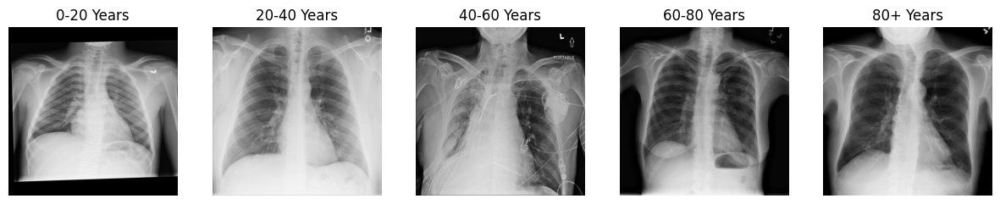

In [10]:
idx = 4

img_cls0 = cv2.imread("../datasets/rsna/" + class0.iloc[idx]["Image Index"])
img_cls1 = cv2.imread("../datasets/rsna/" + class1.iloc[idx]["Image Index"])
img_cls2 = cv2.imread("../datasets/rsna/" + class2.iloc[idx]["Image Index"])
img_cls3 = cv2.imread("../datasets/rsna/" + class3.iloc[idx]["Image Index"])
img_cls4 = cv2.imread("../datasets/rsna/" + class4.iloc[idx]["Image Index"])

plt.figure(figsize=(15,15))
plt.subplot(551);plt.imshow(img_cls0);plt.axis(False);plt.title("0-20 Years")
plt.subplot(552);plt.imshow(img_cls1);plt.axis(False);plt.title("20-40 Years")
plt.subplot(553);plt.imshow(img_cls2);plt.axis(False);plt.title("40-60 Years")
plt.subplot(554);plt.imshow(img_cls3);plt.axis(False);plt.title("60-80 Years")
plt.subplot(555);plt.imshow(img_cls4);plt.axis(False);plt.title("80+ Years")

In [11]:
# Load 500 latent vectors from each class
def load_age_dataset(class0, class1):
    path2latents = '../synthetic_images/latents/'
    X1, y1, X2, y2 = [], [], [], []
    for i in tqdm(range(len(class0))):
        x1_path = os.path.join(path2latents, class0.iloc[i]['Image Index'].split('.')[0] + '.npz')
        X1.append(np.load(x1_path)['100'])
        y1.append(class0.iloc[i]['Patient Age'])
    for i in tqdm(range(len(class1))):
        x2_path = os.path.join(path2latents, class1.iloc[i]['Image Index'].split('.')[0] + '.npz')
        X2.append(np.load(x1_path)['100'])
        y2.append(class1.iloc[i]['Patient Age'])
    return X1,X2,y1,y2

X1,X2,y1,y2 = load_age_dataset(class0, class4)
styles, ages = X1+X2, y1+y2

100%|██████████| 271/271 [00:00<00:00, 608.27it/s]


In [12]:
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
# from sklearn.datasets import make_classification

wX = []
# styles, genders = list(df['style']), list(df['gender'])
for idx in tqdm(range(len(styles))):
    wX.append(styles[idx].reshape((styles[0].shape[0]*styles[0].shape[1]*styles[0].shape[2])))

100%|██████████| 2420/2420 [00:00<00:00, 295124.46it/s]


In [13]:
clf = make_pipeline(LinearSVC(random_state=0, tol=1e-5))
clf.fit(wX, ages)

/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Pipeline(steps=[('linearsvc', LinearSVC(random_state=0, tol=1e-05))])

In [14]:
age_groups = {0: '0-20', 1: '20-40', 2: '40-60', 3: '60-80', 4: '80+'}

Class0:  4  -->  Class1:  4


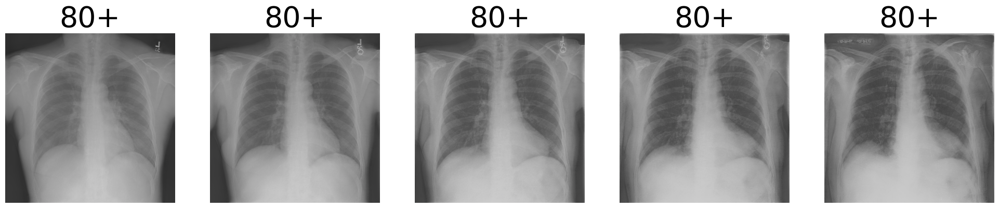

<Figure size 5000x5000 with 0 Axes>

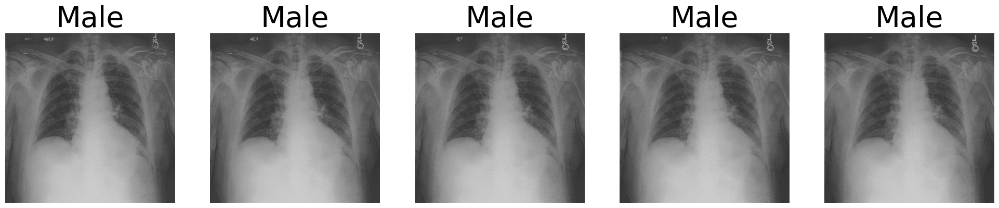

In [51]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
mean_w = get_mean_latent().detach().cpu().numpy()

idx = -15
old_w = styles[idx]; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
age = ages[idx]
alpha = 0
print("Class0: ", age, " -->  Class1: ", ages[-1])
saved_images = []
for idx in range(5):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    saved_images.append(img)
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
        # Female classifier as title
    plt.title(age_groups[age], fontsize="40")
    alpha -= 80
    
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
old_w = styles[idx]+(0.5 * mean_w); v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = 0
for idx in range(5):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img/255.0,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha += 15

# old_w = mean_w; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
# alpha = 0
# for idx in range(5):
#     new_w = old_w + alpha * v
#     img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
#     fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
#     # Female classifier as title
#     if(xray_is_male(img) == False):
#         plt.title('Female', fontsize="40")
#     else:
#         plt.title('Male', fontsize="40")
#     alpha -= 5



In [47]:
for i in range(1, len(saved_images)):
    saved_images[i] =  cv2.cvtColor(saved_images[0] - saved_images[i], cv2.COLOR_BGR2GRAY)
saved_images[0] = cv2.cvtColor(saved_images[0], cv2.COLOR_BGR2GRAY)

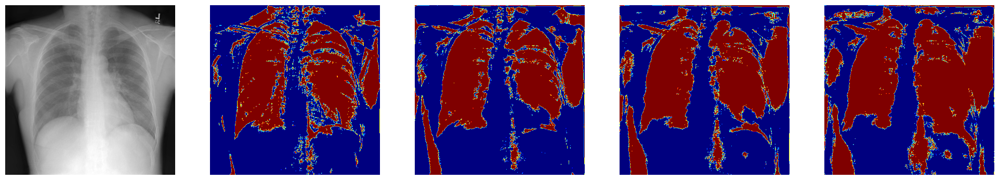

In [48]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
fig.add_subplot(rows, columns, 1); plt.imshow(saved_images[0],cmap='gray'); plt.axis('off')
for idx in range(1, 5):
    img =  saved_images[idx]
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img<200,cmap='jet'); plt.axis('off')

In [14]:
n_true, n_false = len(rsna_df[rsna_df['Target'] == 1]), len(rsna_df[rsna_df['Target'] == 0])
n_total = len(rsna_df)

# Visualize data imbalance
print(round(n_true/n_total * 100, 3), '% Pneumonia')
print(round(n_false/n_total * 100, 3), '% No Finding')

22.53 % Pneumonia
77.47 % No Finding


In [18]:
df[df['gender'] == 'male'].head(10) 

,style,gender,pneumonia,image
1,"[[[-0.31752527, 0.24679357, -0.030114092, 0.94...",male,0,"[[[23, 23, 23], [16, 16, 16], [6, 7, 7], [1, 1..."
2,"[[[-0.17238997, -0.12734872, 0.57618105, 1.333...",male,0,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,"[[[-0.014611144, 1.044476, 0.8671011, 0.058363...",male,0,"[[[22, 22, 22], [9, 9, 9], [3, 3, 3], [2, 2, 2..."
4,"[[[-0.16739823, 1.2000191, 1.571935, 0.1744189...",male,0,"[[[21, 21, 21], [5, 5, 5], [1, 1, 1], [1, 1, 1..."
7,"[[[0.40055397, 0.11514987, 0.063906565, 0.7229...",male,0,"[[[43, 43, 43], [30, 30, 30], [15, 15, 15], [6..."
8,"[[[-0.008307007, 1.7412316, 0.93663704, 0.2158...",male,0,"[[[68, 68, 68], [70, 70, 71], [72, 72, 72], [5..."
10,"[[[-0.25208503, 0.19901562, 1.702472, 0.831455...",male,0,"[[[38, 38, 38], [35, 35, 35], [21, 22, 21], [1..."
16,"[[[-0.19723098, 0.11661448, -0.0034512233, 0.9...",male,0,"[[[49, 49, 49], [50, 50, 50], [45, 45, 45], [2..."
17,"[[[-0.12092437, 0.57190925, 0.22590238, 0.5552...",male,0,"[[[102, 102, 102], [83, 83, 83], [54, 54, 54],..."
18,"[[[-0.20102823, 1.2826829, 1.592641, 0.0512614...",male,0,"[[[23, 23, 23], [17, 17, 17], [12, 12, 12], [1..."


In [ ]:
df[df['pneumonia'] == 1].head(10) 

In [29]:
# # View some images
# images = []
# for idx in tqdm(range(0,1000)):
#     z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device) # get random z vector
#     w = convert_z_to_w(z, truncation_psi=0.7, truncation_cutoff=9) # convert to style vector
#     images.append(generate_image_from_style(w)) # generate image from w

100%|██████████| 1000/1000 [00:13<00:00, 74.82it/s]


In [73]:
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
# from sklearn.datasets import make_classification

wX = []
styles, genders = list(df['style']), list(df['gender'])
for idx in tqdm(range(len(styles))):
    wX.append(styles[idx].reshape((styles[0].shape[0]*styles[0].shape[1]*styles[0].shape[2])))

100%|██████████| 1000/1000 [00:00<00:00, 543233.26it/s]


In [16]:
# X, y = make_classification(n_features=4, random_state=0)
# print(np.array(wX).shape, X.shape)
# print(np.array(genders).shape, y.shape)

In [74]:
clf = make_pipeline(LinearSVC(random_state=0, tol=1e-5))
clf.fit(wX, genders)

/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Pipeline(steps=[('linearsvc', LinearSVC(random_state=0, tol=1e-05))])

## Female w/ pneumonia

In [154]:
# retraine linear svm
wX.append(latent_w.reshape((styles[0].shape[0]*styles[0].shape[1]*styles[0].shape[2])))# add new style embedding to style list
genders.append('female')

clf = make_pipeline(LinearSVC(random_state=0, tol=1e-5))
clf.fit(wX, genders) # re-fit Linear SVM

/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Pipeline(steps=[('linearsvc', LinearSVC(random_state=0, tol=1e-05))])

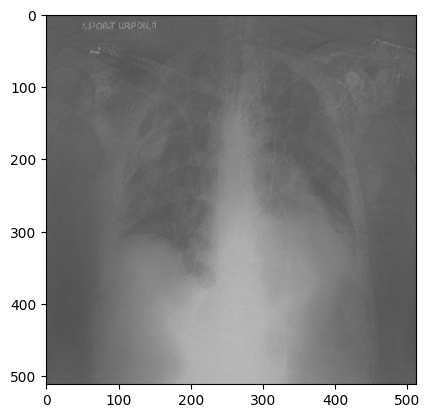

In [76]:
latent_w = '../synthetic_images/latents/00005631_003.npz'
latent_w = np.load(latent_w)['100']
img = generate_image_from_style(torch.from_numpy(latent_w).to('cuda'))
plt.imshow(img)

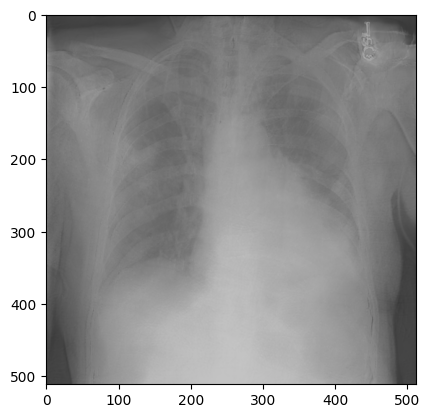

In [87]:
latent_w = '../synthetic_images/latents/00000506_007.npz'
latent_w = np.load(latent_w)['100']
img = generate_image_from_style(torch.from_numpy(latent_w).to('cuda'))
plt.imshow(img)

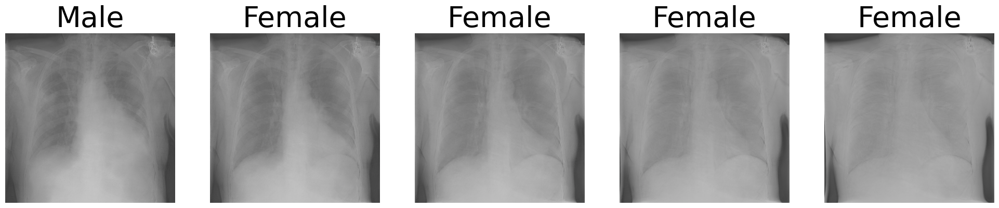

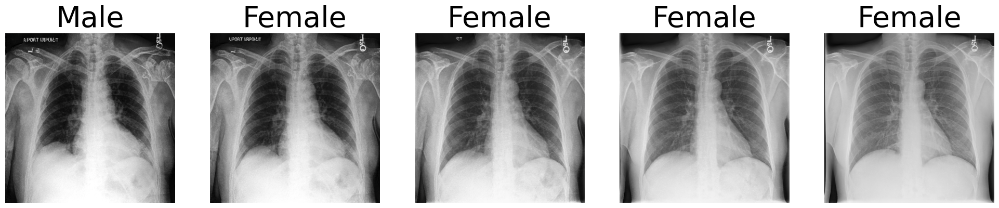

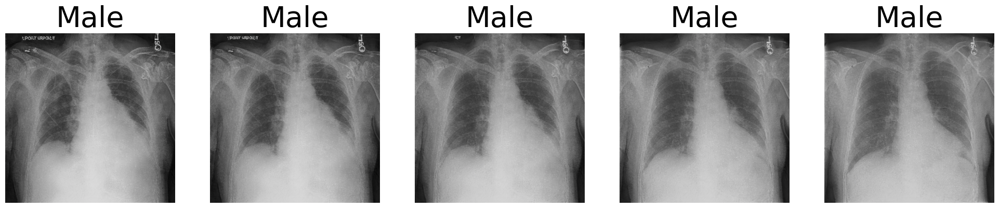

In [98]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
mean_w = get_mean_latent().detach().cpu().numpy()

old_w = latent_w; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = 0
for idx in range(5):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha -= 5
    
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

old_w = mean_w; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = 0
for idx in range(5):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha -= 5

fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
old_w = latent_w+mean_w; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = 0
for idx in range(5):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha -= 5

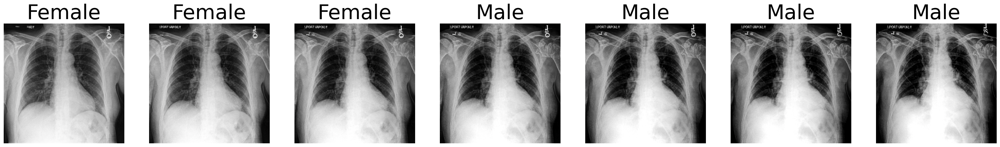

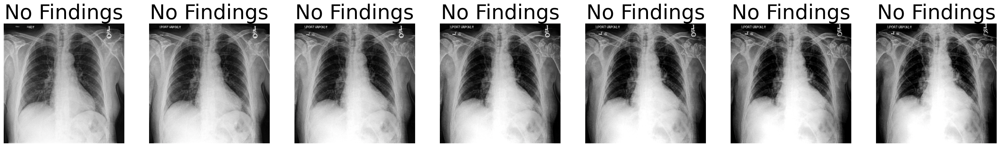

In [49]:
import random
import matplotlib.pyplot as plt

fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
subject = 290

old_w = styles[subject]; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = 0
new_latents = []
for idx in range(7):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha += 5
    new_latents.append(img)

old_w = styles[subject];
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
alpha = 0
for idx in range(7):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_has_pneumonia(img) == False):
        plt.title('No Findings', fontsize="40")
    else:
        plt.title('Pneumonia', fontsize="40")

    alpha += 5

Text(0.5, 1.0, 'Subimage')

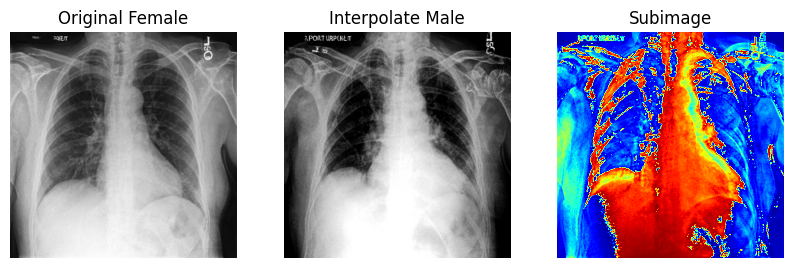

In [46]:
plt.figure(figsize=(10,10))
plt.subplot(331);plt.imshow(new_latents[0]);plt.axis(False);plt.title("Original Female")
plt.subplot(332);plt.imshow(new_latents[6]);plt.axis(False);plt.title("Interpolate Male")
plt.subplot(333);plt.imshow(cv2.cvtColor(new_latents[0] - new_latents[6], cv2.COLOR_BGR2GRAY), cmap="jet");plt.axis(False);plt.title("Subimage")

## Male w/ pneumonia

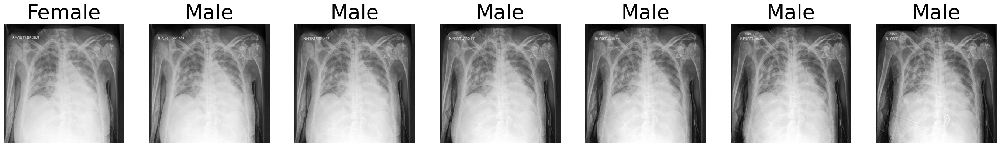

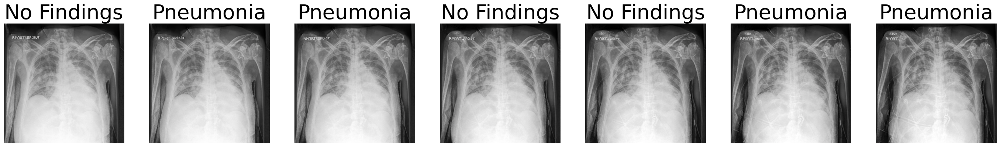

In [50]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

old_w = styles[207]; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = -80
for idx in range(7):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha += 10

old_w = styles[207];
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
alpha = -80
for idx in range(7):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_has_pneumonia(img) == False):
        plt.title('No Findings', fontsize="40")
    else:
        plt.title('Pneumonia', fontsize="40")

    alpha += 10
    

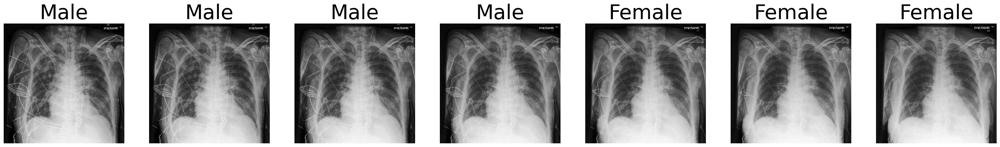

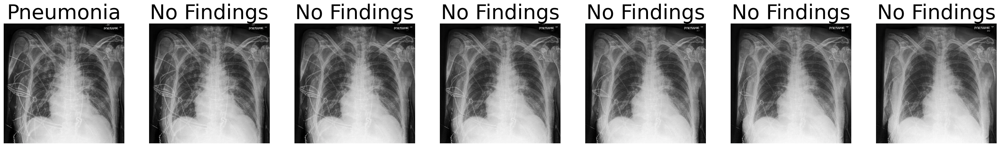

In [240]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

old_w = styles[200]; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[1].shape))
alpha = 0
for idx in range(7):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="40")
    else:
        plt.title('Male', fontsize="40")
    alpha -= 20

old_w = styles[200];
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
alpha = 0
for idx in range(7):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_has_pneumonia(img) == False):
        plt.title('No Findings', fontsize="40")
    else:
        plt.title('Pneumonia', fontsize="40")

    alpha -= 20

In [57]:
from torchvision import models as tv
import torch
import torchvision
from torchvision import models, transforms

classifier_path = "../resnet50_gender_classifier.pth" # {resnet50_cardiomegaly_classifier, resnet50_cardiomegaly_classifier,
                                                            # resnet50_gender_classifier}

# Reload the model structure
cnn = torchvision.models.resnet50(pretrained=False)  # Set pretrained=False since we are loading custom weights
cnn = torch.nn.DataParallel(cnn)
# # Modify the fully connected layer for gender classification (if necessary)
# num_features = cnn.fc.in_features
# cnn.fc = torch.nn.Linear(num_features, 2)

# Load the saved weights
cnn.load_state_dict(torch.load(classifier_path))

# Move the model to the appropriate device
cnn = cnn.to(device)
cnn.eval()  # Set the model to evaluation mode

print("Model weights loaded successfully!")

/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Model weights loaded successfully!


In [58]:
# Returns whether face is perceptually female (True) or male (False) given
# an input image of shape (H, W, 3).
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ResNet50 expects 224x224 images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Pretrained ResNet normalization
])

In [61]:
# if true than model predicts male else female
def xray_is_male(img):
    im = Image.fromarray(img)
    im = transform(im)
#     im = Image.fromarray(im).convert("RGB") # if greyscale
    logits = cnn(im[None,:,:,:])[0,0]
    return (logits < 0.5).detach().cpu().numpy()

In [70]:
from tqdm import tqdm
import numpy as np
"""
:- Sample 1000 random z vectors
:- Then convert them to style vectors w
:- Get their corresponding perceived genders
"""
styles, genders, pneumonia, images = [],[],[],[]
for idx in tqdm(range(0,1000)):
    z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device) # get random z vector
    w = convert_z_to_w(z, truncation_psi=0.7, truncation_cutoff=9) # convert to style vector
    img = generate_image_from_style(w) # generate image from w
    gen = xray_is_male(img) # classify image with cnn classifier
    # save data
    styles.append(w.cpu().detach().numpy()); images.append(img)
    genders.append(gen);

100%|██████████| 1000/1000 [00:30<00:00, 32.84it/s]


In [71]:
genders

[array(True),
 array(False),
 array(True),
 array(False),
 array(False),
 array(True),
 array(True),
 array(False),
 array(True),
 array(True),
 array(True),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(True),
 array(False),
 array(False),
 array(True),
 array(False),
 array(True),
 array(False),
 array(False),
 array(False),
 array(True),
 array(False),
 array(False),
 array(False),
 array(False),
 array(True),
 array(False),
 array(False),
 array(True),
 array(True),
 array(True),
 array(True),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(True),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(True),
 array(False),
 array(False),
 array(False),
 array(True),
 array(True),
 array(False),
 array(True),
 array(False),
 array(False),
 array(True),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 array(False),
 a

In [6]:
#@title Function to plot the synthetic image per iterations

def show_images_results(latent_codes, iterations_to_show, subfix = "", save = False):

    saved_iterations = list(latent_codes.keys())
    iterations_to_show_filter = [iter for iter in iterations_to_show if str(iter) in saved_iterations]

    n_images = len(iterations_to_show_filter) + 1
    inches = 4
    fig, axs = plt.subplots(1,n_images ,figsize=(inches * n_images , inches))

    # original image
    with open(PATH_IMAGE,"rb") as f:
        image=Image.open(f)
        axs[0].imshow(image)
        axs[0].set_title('Original')
        axs[0].axis('off')

    # embeddings per iterations
    idx = 1
    for iter in iterations_to_show:
      latent = latent_codes.get(str(iter))

      if latent is not None:
        tensor_latent = torch.tensor(latent).to(DEVICE)
        synth_img = G.synthesis(tensor_latent, noise_mode='const', force_fp32=True)
        synth_img = (synth_img + 1.0) / 2.0
        synth_img = synth_img.detach().to('cpu').squeeze(0).permute(1, 2, 0)       
        axs[idx].imshow(synth_img.clamp(0,1))
        axs[idx].set_title("Iteration: {}".format(str(iter)))
        axs[idx].axis('off')

        idx += 1
      else:
        print("Iteration {} is not stored in file".format(iter))

In [25]:
# Generates an image from a style vector.
def generate_image_from_style(dlatent, noise_mode='none'):
    print(dlatent.shape)
    if len(dlatent.shape) == 1: 
        dlatent = dlatent.unsqueeze(0)

    synth_img = G.synthesis(dlatent, noise_mode='none', force_fp32=True)
    synth_img = (synth_img + 1.0) / 2.0
    row_images = synth_img.detach().to('cpu').squeeze(0).permute(1, 2, 0)  
#     row_images = (row_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return row_images.cpu().numpy() 

In [9]:
import os
#@title Function to load latents
# Function to load the latents from the saved .npz file
def load_latents(file_name, display_latents = False):
  latent_embeddings_saved = file_name

  dictionary = {}
  with open(latent_embeddings_saved, 'rb') as f:
      container = np.load(f)
      
      for iter, latent in container.items():
          dictionary[iter] = latent
          if display_latents:
            print("iter: {} -- latent_code shape: {}".format(iter,latent.shape))
            print(latent[0,0,-5:])
  return dictionary

# saved_w = load_latents(latent)['500']

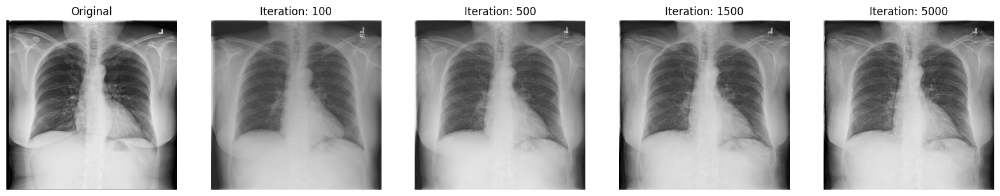

In [92]:
DEVICE = device
PATH_IMAGE = '../datasets/rsna/00003777_000.png'
latent_codes = load_latents("../synthetic_images/latents/00003777_000_latents_iters_005000_step_0100_loss_vgg16_w_mean.npz")
show_images_results(latent_codes, iterations_to_show = [100, 500, 1500, 5000], subfix = "_w_mean", save = True)

In [113]:
# healthy, cardiomegaly = [], []
# v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
# for i in tqdm(range(1000)):
#     old_w = styles[i]
#     new_w = old_w + alpha * v
#     img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
#     if(xray_is_female(img)):
#         cardiomegaly.append(img)
#     else:
#         healthy.append(img)
# print("#ofhealthy: ", len(healthy), " #ofunhealthy: ", len(cardiomegaly))

male, female = [], []
v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
for i in tqdm(range(1000)):
    old_w = styles[i]
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    if(xray_is_female(img)):
        cardiomegaly.append(img)
    else:
        healthy.append(img)
print("#ofhealthy: ", len(healthy), " #ofunhealthy: ", len(cardiomegaly))

 33%|███▎      | 329/1000 [00:15<00:30, 21.93it/s]


KeyboardInterrupt: 

In [76]:
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
# from sklearn.datasets import make_classification

wX = []
# styles, genders = list(df['style']), list(df['gender'])
for idx in tqdm(range(len(styles))):
    wX.append(styles[idx].reshape((styles[0].shape[0]*styles[0].shape[1]*styles[0].shape[2])))

100%|██████████| 1000/1000 [00:00<00:00, 635500.61it/s]


In [77]:
clf = make_pipeline(LinearSVC(random_state=0, tol=1e-5))
clf.fit(wX, genders)

/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/home/uwaejaso/.conda/envs/ada/lib/python3.8/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Pipeline(steps=[('linearsvc', LinearSVC(random_state=0, tol=1e-05))])

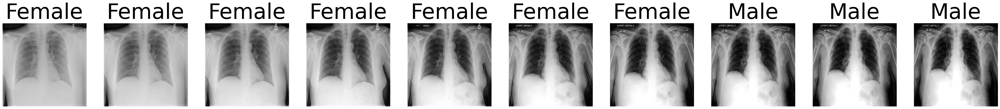

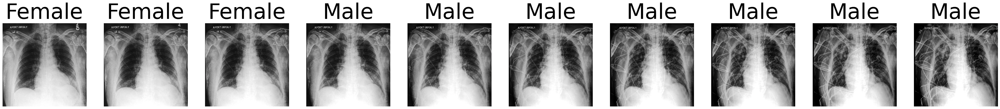

In [78]:
import random
import matplotlib.pyplot as plt

fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

old_w = styles[202]; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = -20
for idx in range(10):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="60")
    else:
        plt.title('Male', fontsize="60")
    alpha += 5

old_w = styles[102];
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10
alpha = -20
for idx in range(10):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')
    # Female classifier as title
    if(xray_is_male(img) == False):
        plt.title('Female', fontsize="60")
    else:
        plt.title('Male', fontsize="60")

    alpha += 5

In [28]:
import os
savepath = "results/cxr_cardiomegaly_interpolation/" # {cxr_age_interpolation, cxr_gender_interpolation, cxr_cardiomegaly_interpolation}
if not os.path.exists(savepath):
    os.makedirs(savepath)

In [29]:
old_w = styles[4]; v = clf.named_steps['linearsvc'].coef_[0].reshape((styles[0].shape))
alpha = -30
for idx in tqdm(range(50)):
    new_w = old_w + alpha * v
    img = generate_image_from_style(torch.from_numpy(new_w).to('cuda'))
    if(xray_is_female(img) == False):
        path = savepath+f"{idx}_f.png"
    else:
        path = savepath+f"{idx}_m.png"
    cv2.imwrite(path, img)
    alpha += 1

100%|██████████| 50/50 [00:02<00:00, 22.82it/s]


## Generate images from styles

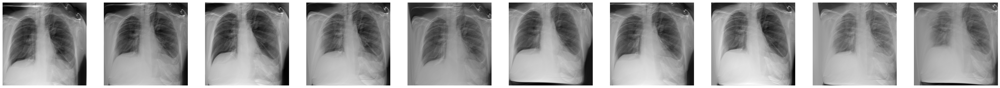

In [53]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

for idx in range(20,30):
    img = generate_image_from_style(torch.from_numpy(styles[idx]).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')

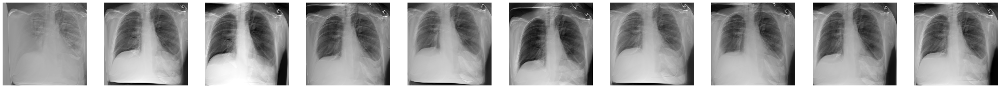

In [61]:
fig, rows, columns = plt.figure(figsize=(50, 50)), 10,10

for idx in range(90,100):
    img = generate_image_from_style(torch.from_numpy(styles[idx]).to('cuda'))
    fig.add_subplot(rows, columns, idx+1); plt.imshow(img,cmap='gray'); plt.axis('off')